In [1]:
import os
os.chdir('..')

In [2]:
import pandas as pd, numpy as np, seaborn as sns
from modules.get_data import get_data, get_x_y
from jh_utils.data.pandas.preprocessing import make_dummies
import matplotlib.pyplot as plt

In [2]:
raw = pd.read_csv('asteroides/asteoides.csv')

/tmp/ipykernel_18084/668935226.py:1: DtypeWarning: Columns (3,4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  raw = pd.read_csv('asteroides/asteoides.csv')


In [3]:
raw.columns

Index(['id', 'spkid', 'full_name', 'pdes', 'name', 'prefix', 'neo', 'pha', 'H',
       'diameter', 'albedo', 'diameter_sigma', 'orbit_id', 'epoch',
       'epoch_mjd', 'epoch_cal', 'equinox', 'e', 'a', 'q', 'i', 'om', 'w',
       'ma', 'ad', 'n', 'tp', 'tp_cal', 'per', 'per_y', 'moid', 'moid_ld',
       'sigma_e', 'sigma_a', 'sigma_q', 'sigma_i', 'sigma_om', 'sigma_w',
       'sigma_ma', 'sigma_ad', 'sigma_n', 'sigma_tp', 'sigma_per', 'class',
       'rms'],
      dtype='object')

In [4]:
raw.shape

(958524, 45)

In [13]:
raw[raw.prefix=='A'].head(3)

,id,spkid,full_name,pdes,name,prefix,neo,pha,H,diameter,...,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,class,rms
929462,bK17U010,3788040,'Oumuamua (A/2017 U1),2017 U1,'Oumuamua,A,NaN,N,22.080,NaN,...,0.000288,0.000254,0.001249,0.006116,NaN,8.108400e-05,0.000264,NaN,HYA,0.43612
941727,bK18V030,3836481,(A/2018 V3),2018 V3,NaN,A,N,N,15.800,NaN,...,0.000005,0.000030,0.000030,0.000006,0.011501,5.253100e-08,0.000021,34.923,TNO,0.27805
946609,bK19G020,3841497,(A/2019 G2),2019 G2,NaN,A,N,N,16.312,NaN,...,0.000018,0.000056,0.000107,0.000012,1.807700,1.086200e-07,0.000189,12991.000,TNO,0.43573


In [14]:
raw.neo.unique()

array(['N', 'Y', nan], dtype=object)

In [15]:
raw.pha.unique()

array(['N', 'Y', nan], dtype=object)

In [16]:
raw.head().transpose()

,0,1,2,3,4
id,a0000001,a0000002,a0000003,a0000004,a0000005
spkid,2000001,2000002,2000003,2000004,2000005
full_name,1 Ceres,2 Pallas,3 Juno,4 Vesta,5 Astraea
pdes,1,2,3,4,5
name,Ceres,Pallas,Juno,Vesta,Astraea
prefix,NaN,NaN,NaN,NaN,NaN
neo,N,N,N,N,N
pha,N,N,N,N,N
H,3.4,4.2,5.33,3.0,6.9
diameter,939.4,545.0,246.596,525.4,106.699


###### fatores
class, equinoxorbit_id, pha, neo

In [17]:
raw['class'].unique()

array(['MBA', 'OMB', 'MCA', 'AMO', 'IMB', 'TJN', 'CEN', 'APO', 'ATE',
       'AST', 'TNO', 'IEO', 'HYA'], dtype=object)

In [18]:
raw['moid'].unique()

array([1.59478  , 1.23429  , 1.03429  , ..., 0.0355888, 0.893896 ,
       0.68022  ])

In [19]:
raw.columns[:6]

Index(['id', 'spkid', 'full_name', 'pdes', 'name', 'prefix'], dtype='object')

In [20]:
raw.head().iloc[:,6:]

,neo,pha,H,diameter,albedo,diameter_sigma,orbit_id,epoch,epoch_mjd,epoch_cal,...,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,class,rms
0,N,N,3.40,939.400,0.0900,0.200,JPL 47,2458600.5,58600,20190427.0,...,4.608900e-09,6.168800e-08,6.624800e-08,7.820700e-09,1.111300e-11,1.196500e-12,3.782900e-08,9.415900e-09,MBA,0.43301
1,N,N,4.20,545.000,0.1010,18.000,JPL 37,2459000.5,59000,20200531.0,...,3.469400e-06,6.272400e-06,9.128200e-06,8.859100e-06,4.961300e-09,4.653600e-10,4.078700e-05,3.680700e-06,MBA,0.35936
2,N,N,5.33,246.596,0.2140,10.594,JPL 112,2459000.5,59000,20200531.0,...,3.223100e-06,1.664600e-05,1.772100e-05,8.110400e-06,4.363900e-09,4.413400e-10,3.528800e-05,3.107200e-06,MBA,0.33848
3,N,N,3.00,525.400,0.4228,0.200,JPL 35,2458600.5,58600,20190427.0,...,2.170600e-07,3.880800e-07,1.789300e-07,1.206800e-06,1.648600e-09,2.612500e-10,4.103700e-06,1.274900e-06,MBA,0.39980
4,N,N,6.90,106.699,0.2740,3.140,JPL 114,2459000.5,59000,20200531.0,...,2.740800e-06,2.894900e-05,2.984200e-05,8.303800e-06,4.729000e-09,5.522700e-10,3.474300e-05,3.490500e-06,MBA,0.52191


In [21]:
x = raw.nunique()/raw.shape[0]

In [22]:
x.sort_values()

equinox           0.000001
prefix            0.000001
neo               0.000002
pha               0.000002
class             0.000014
albedo            0.001103
diameter_sigma    0.003186
orbit_id          0.004893
epoch_cal         0.005473
epoch_mjd         0.005473
epoch             0.005473
H                 0.009900
diameter          0.017309
name              0.023019
rms               0.067172
sigma_i           0.225076
sigma_om          0.232811
sigma_q           0.258875
sigma_n           0.262643
sigma_e           0.265763
sigma_w           0.274087
sigma_ma          0.278361
sigma_ad          0.280891
sigma_a           0.285123
sigma_per         0.294919
sigma_tp          0.303848
moid              0.327900
moid_ld           0.327901
i                 0.999885
e                 0.999917
tp_cal            0.999974
ad                0.999980
a                 0.999984
q                 0.999984
per               0.999985
per_y             0.999986
n                 0.999990
o

----

In [3]:
x,y = get_x_y()

/home/joaoholz/Documents/ufes/trabalho_final/modules/get_data.py:6: DtypeWarning: Columns (3,4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  return pd.read_csv("asteroides/asteoides.csv").iloc[:, first_columns:]


In [5]:
x.columns
#

Index(['neo', 'H', 'epoch', 'e', 'a', 'q', 'i', 'om', 'w', 'ma', 'ad', 'n',
       'tp', 'per', 'moid', 'sigma_e', 'sigma_a', 'sigma_q', 'sigma_i',
       'sigma_om', 'sigma_w', 'sigma_ma', 'sigma_ad', 'sigma_n', 'sigma_tp',
       'sigma_per', 'rms', 'class_APO', 'class_AST', 'class_ATE', 'class_CEN',
       'class_IEO', 'class_IMB', 'class_MBA', 'class_MCA', 'class_OMB',
       'class_TJN', 'class_TNO'],
      dtype='object')

In [4]:
x.shape

(932335, 38)

In [7]:
ls = np.random.randint(932335,size=5000)

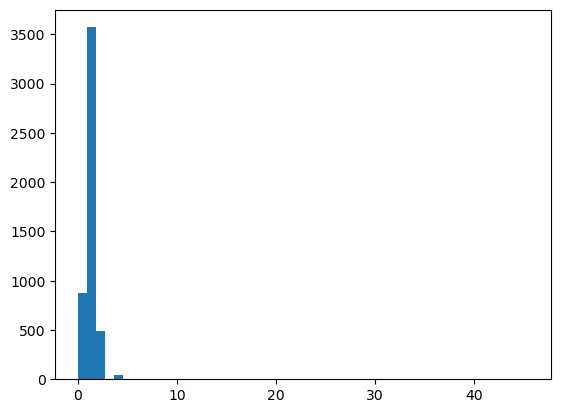

In [10]:
_ = plt.hist(x['moid'].iloc[ls],50)

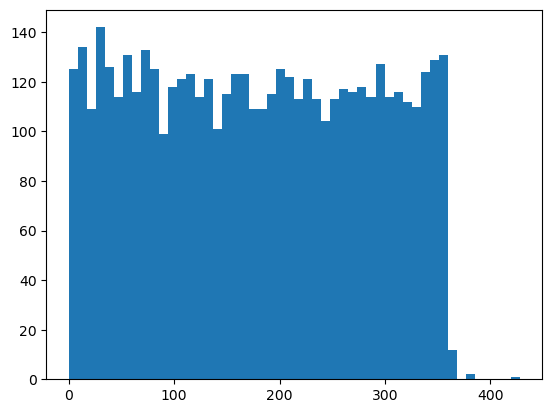

In [14]:
_ = plt.hist(x['ma'].iloc[ls],50)

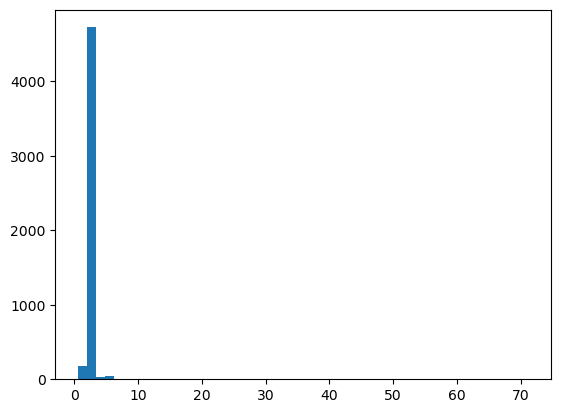

In [12]:
_ = plt.hist(x['a'].iloc[ls],50)

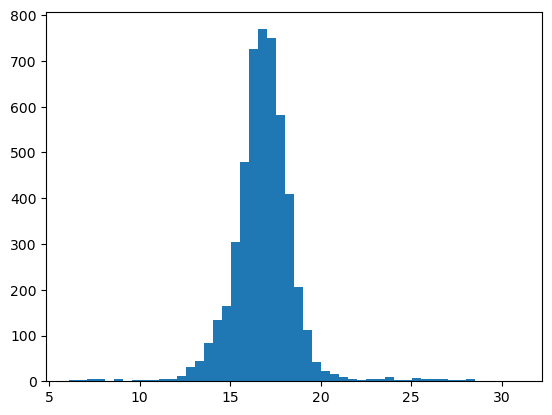

In [15]:
_ = plt.hist(x['H'].iloc[ls],50)

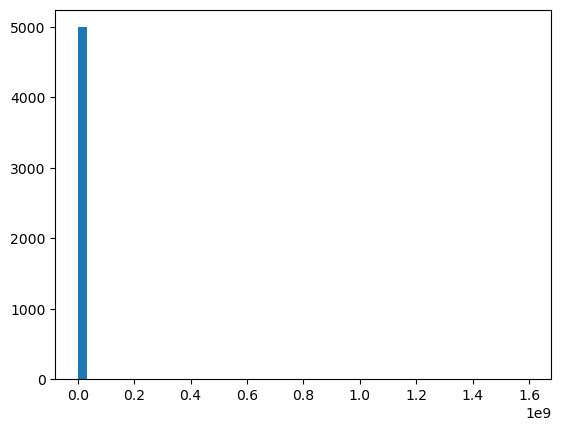

In [16]:
_ = plt.hist(x['sigma_w'].iloc[ls],50)

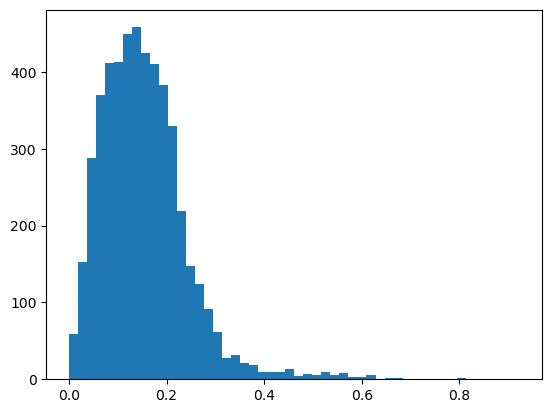

In [17]:
_ = plt.hist(x['e'].iloc[ls],50)

In [21]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)

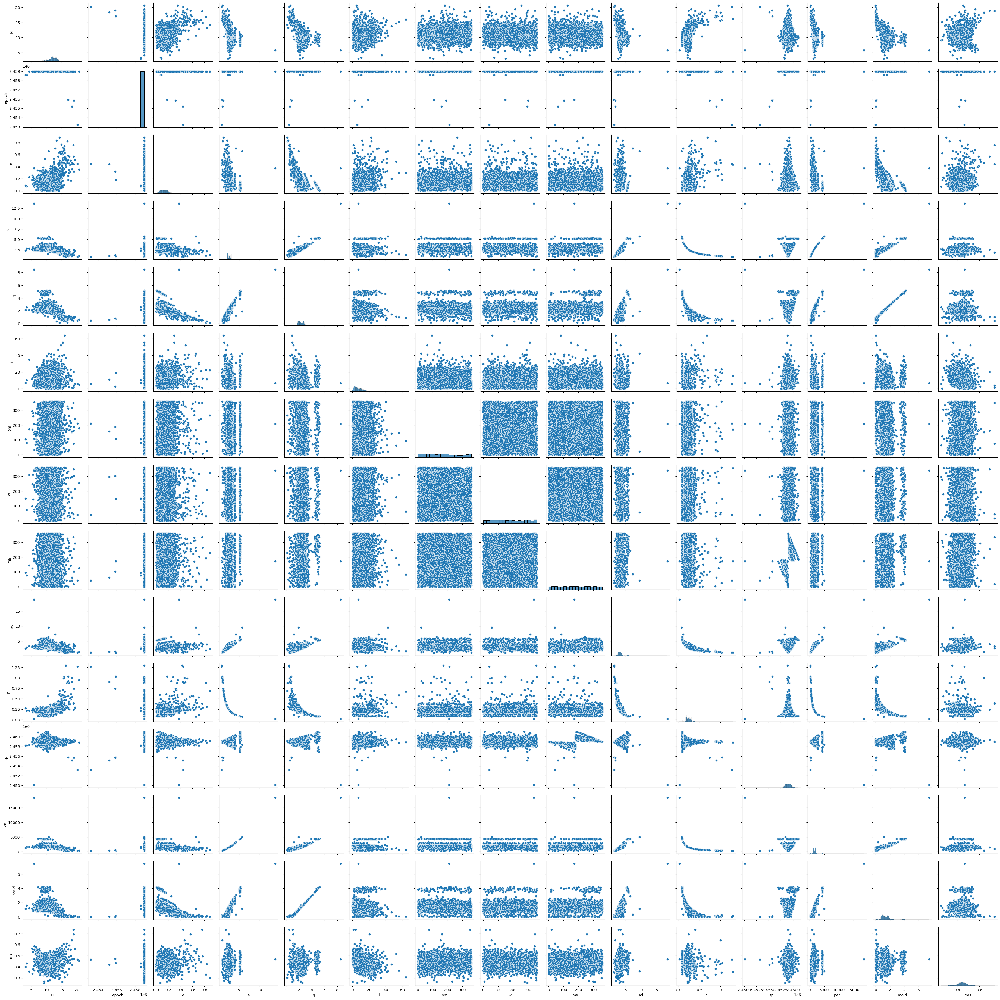

In [8]:
_ = sns.pairplot(x[['H', 'epoch', 'e', 'a', 'q', 'i', 'om', 'w', 'ma', 'ad', 'n',
'tp', 'per', 'moid', 'rms']].iloc[:5000])

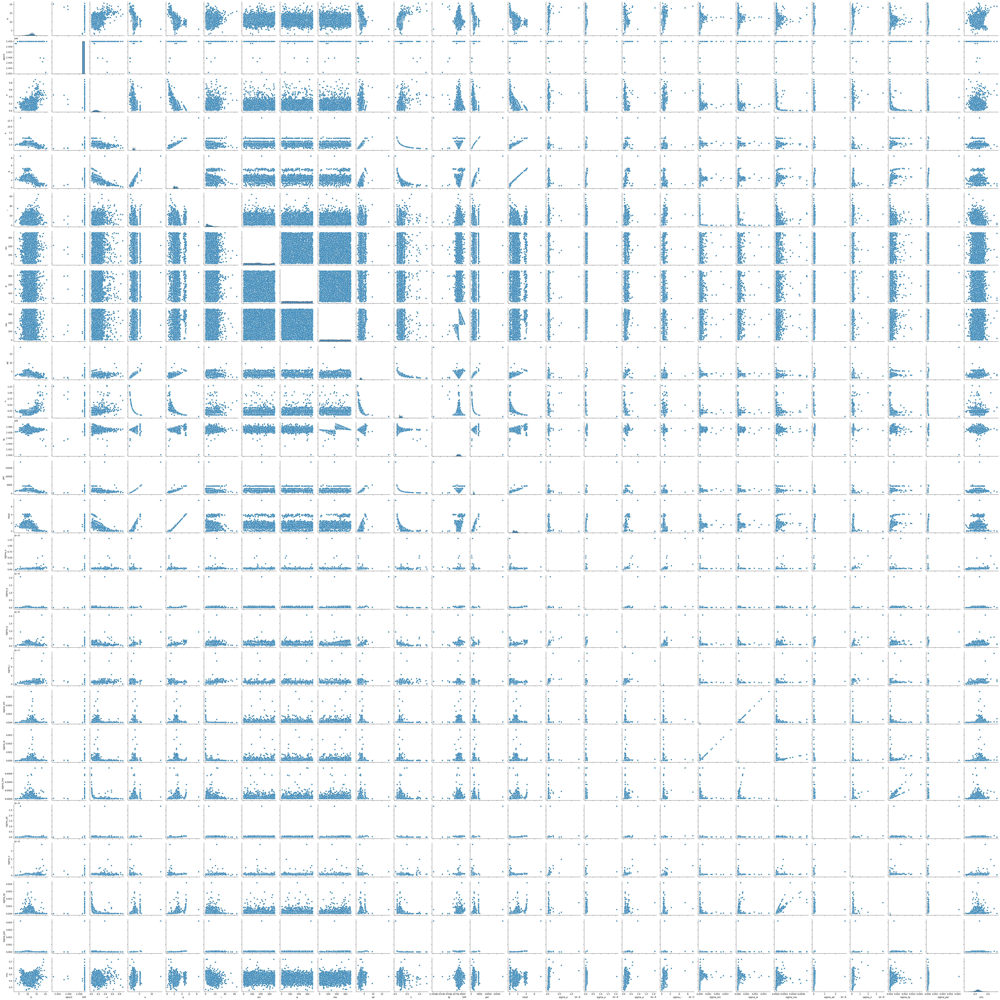

In [7]:
_ = sns.pairplot(x[['H', 'epoch', 'e', 'a', 'q', 'i', 'om', 'w', 'ma', 'ad', 'n',
'tp', 'per', 'moid', 'sigma_e', 'sigma_a', 'sigma_q', 'sigma_i',
'sigma_om', 'sigma_w', 'sigma_ma', 'sigma_ad', 'sigma_n', 'sigma_tp',
'sigma_per', 'rms']].iloc[:5000])

In [6]:
x[['H', 'epoch', 'e', 'a', 'q', 'i', 'om', 'w', 'ma', 'ad', 'n',
'tp', 'per', 'moid', 'sigma_e', 'sigma_a', 'sigma_q', 'sigma_i',
'sigma_om', 'sigma_w', 'sigma_ma', 'sigma_ad', 'sigma_n', 'sigma_tp',
'sigma_per', 'rms']].iloc[:5000]

,H,epoch,e,a,q,i,om,w,ma,ad,...,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,rms
0,3.40,2458600.5,0.076009,2.769165,2.558684,10.594067,80.305531,73.597695,77.372098,2.979647,...,1.956900e-11,4.608900e-09,6.168800e-08,6.624800e-08,7.820700e-09,1.111300e-11,1.196500e-12,3.782900e-08,9.415900e-09,0.43301
1,4.20,2459000.5,0.229972,2.773841,2.135935,34.832932,173.024741,310.202392,144.975675,3.411748,...,8.832200e-08,3.469400e-06,6.272400e-06,9.128200e-06,8.859100e-06,4.961300e-09,4.653600e-10,4.078700e-05,3.680700e-06,0.35936
2,5.33,2459000.5,0.256936,2.668285,1.982706,12.991043,169.851482,248.066193,125.435355,3.353865,...,8.139200e-08,3.223100e-06,1.664600e-05,1.772100e-05,8.110400e-06,4.363900e-09,4.413400e-10,3.528800e-05,3.107200e-06,0.33848
3,3.00,2458600.5,0.088721,2.361418,2.151909,7.141771,103.810804,150.728541,95.861938,2.570926,...,1.928600e-09,2.170600e-07,3.880800e-07,1.789300e-07,1.206800e-06,1.648600e-09,2.612500e-10,4.103700e-06,1.274900e-06,0.39980
4,6.90,2459000.5,0.190913,2.574037,2.082619,5.367427,141.571026,358.648418,17.846343,3.065455,...,6.092400e-08,2.740800e-06,2.894900e-05,2.984200e-05,8.303800e-06,4.729000e-09,5.522700e-10,3.474300e-05,3.490500e-06,0.52191
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,13.30,2459000.5,0.242174,2.545932,1.929374,5.097024,112.241949,275.957472,82.566333,3.162490,...,1.147100e-07,5.221300e-06,4.237000e-05,4.442700e-05,1.431400e-05,1.373600e-08,1.580700e-09,5.876700e-05,9.666800e-06,0.49700
4996,13.00,2459000.5,0.330419,2.869604,1.921431,32.739509,10.656450,57.859060,299.874958,3.817777,...,1.197000e-07,1.251500e-05,1.272000e-05,2.551500e-05,2.203600e-05,2.773100e-08,2.209100e-09,1.103500e-04,1.934600e-05,0.50812
4997,12.00,2459000.5,0.073258,3.006349,2.786110,9.905788,352.224841,100.653472,106.630856,3.226588,...,9.214600e-08,4.817600e-06,2.077800e-05,3.988800e-05,3.370900e-05,1.609600e-08,1.414800e-09,1.780000e-04,1.424700e-05,0.44688
4998,12.20,2459000.5,0.040563,3.019641,2.897157,10.482362,155.786513,347.365617,145.165399,3.142126,...,9.288700e-08,3.488600e-06,2.122400e-05,5.488500e-05,4.969800e-05,1.696500e-08,1.521200e-09,2.657000e-04,1.552200e-05,0.44529
